## Neural Network + Mean Shift Approach

#### Imports

In [1]:
import cv2
import pandas as pd
import pymeanshift as pms
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import mlflow.keras
import json
import os

from ipyfilechooser import FileChooser
import tensorflow.keras as keras
from sklearn.utils import resample
from baseline import display_results, baseline_augmented
from dataprocessor import preprocess_data, calculate_metrics, resample_df, split_data
from model import feature_regression_model, feature_classification_model, predict_ground_truth
from datamaker import make_cluster_separated_metadata, update_thresholds, create_analysis_data
from constants import ORIGINAL_IMAGES_CSV, BASELINE_AUGMENTED_METRIC_CSV_FILE, BASELINE_METRIC_CSV_FILE, BASELINE_TOPTHIRD_METRIC_CSV_FILE, CLUSTER_SEPARATED_METADATA_CSV_FILE, CLUSTER_REGRESSION_CSV_FILE, CLUSTER_CLASSIFICATION_CSV_FILE, BASELINE_TOPTHIRD_RR8_METRIC_CSV_FILE, BASELINE_TOPTHIRD_AUGMENTED_METRIC_CSV_FILE, COLUMNS, THRESHOLD, CLUSTER_SEPARATED_PATH_LABEL_CSV_FILE

### Data Analysis of the Clusters

#### Pre-processing and Plotting the distribution of the clusters

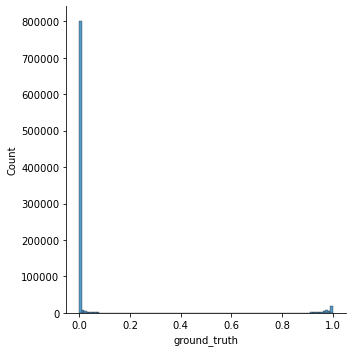

In [3]:
df_output = preprocess_data(CLUSTER_SEPARATED_METADATA_CSV_FILE, COLUMNS, plot=True)

#### Calculating the overall maximum performance we can gain from the data

In the following section, we use the pre-processed data fro the cluster analysis (where we have the percentage of sky of each cluster), and we take the precision and recall for each cluster and the number of pixels in each cluster as well. We get two sets of values, which are our theoretical limits to how well we can build a decision algorithm on top of this data.

Metric Values per Clusters

In [4]:
df_cluster_cases = calculate_metrics(df_output, THRESHOLD, print_metrics=True, pixel_level_calculation=False)

True positive: 36484 (number of clusters, added)
False positive: 1597 (number of clusters, added)
True negative: 830630 (number of clusters, added)
False negative: 22206 (number of clusters, added)
Precision: 0.9580630760746829
Recall: 0.6216391208042256
F1: 0.7540275495758026


Metric values per pixel, added together

In [5]:
df_pixel_cases = calculate_metrics(df_output, THRESHOLD, print_metrics=True, pixel_level_calculation=True)

True positive: 1203447617 (pixels)
False positive: 46582137 (pixels)
True negative: 1212402993 (pixels)
False negative: 33219665 (pixels)
Precision: 0.9627351774220247
Recall: 0.9731377505627258
F1: 0.9679085144492044


For all clusters that are classified as sky, show the distribution of ground_truth value

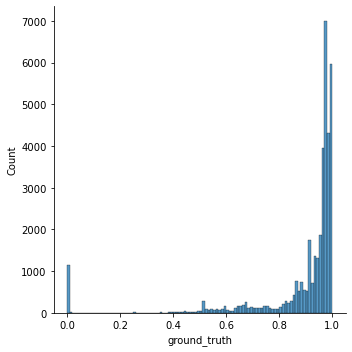

In [4]:
#for all rows in df where predicted_value = 1, plot the ground_truth value against the number of pixels/65536
df_plot = df_output[df_output['predicted_value'] == 1]
sns.displot(df_plot['ground_truth'], bins=100)#, y=df_plot['num_pixels']/65536)

For all clusters that are classified as ground, show the distribution of ground_truth value

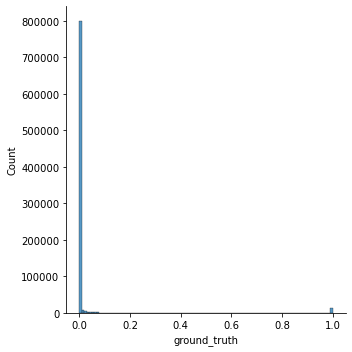

In [5]:
#for all rows in df where predicted_value = 0, plot the ground_truth value against the number of pixels/65536
df_plot = df_output[df_output['predicted_value'] == 0]
sns.displot(df_plot['ground_truth'], bins=100)#, y=df_temp['num_pixels']/65536)

#### Plotting the Clusters based on RGB values with a ground_truth value more than the threshold

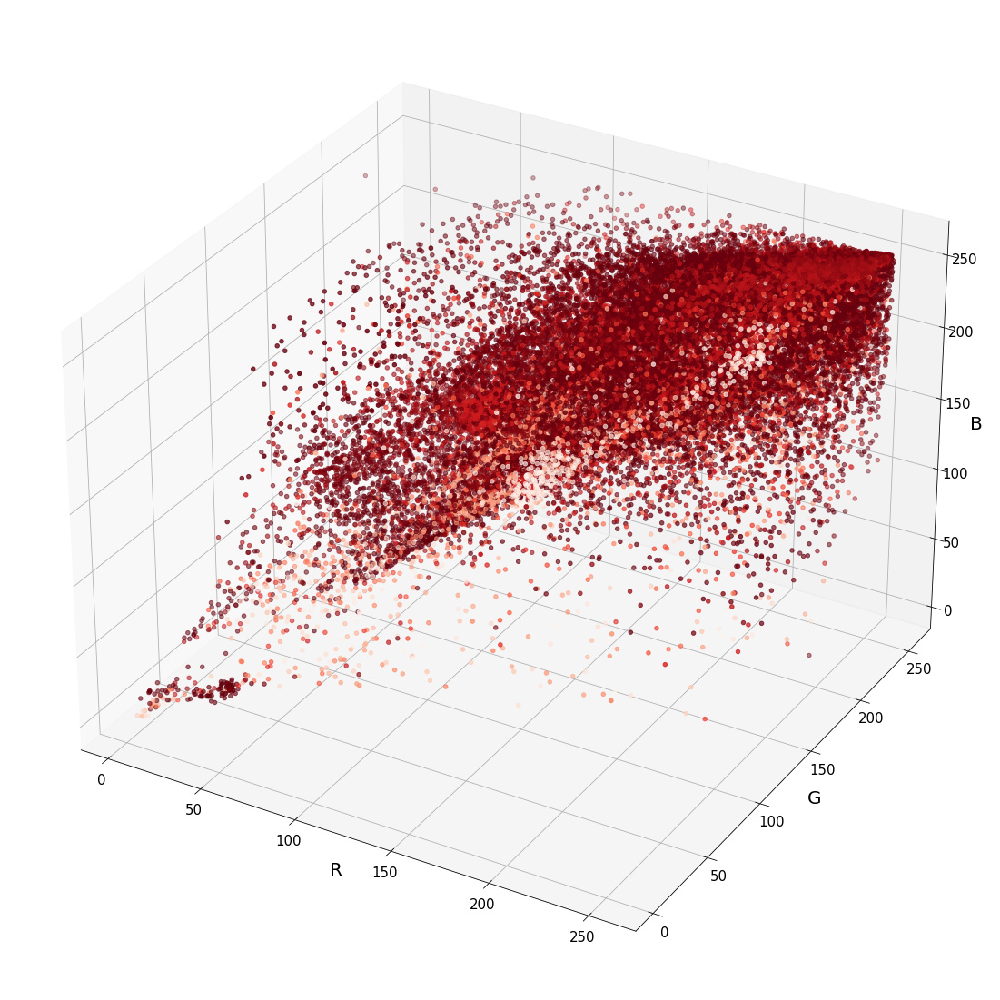

In [11]:
#for all rows in df_output, create a 3D plot of the R G and B value with higher values of ground_truth being redder
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(projection='3d')
df_filtered = df_output[df_output['ground_truth'] > THRESHOLD]
ax.scatter(df_filtered['R'], df_filtered['G'], df_filtered['B'], c=df_filtered['ground_truth'], cmap='Reds')     
ax.set_xlabel('R', fontsize=20)
ax.set_ylabel('G', fontsize=20)
ax.set_zlabel('B', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.show()

#### Plotting the Clusters based on cX and cY values with a ground_truth value less than the threshold

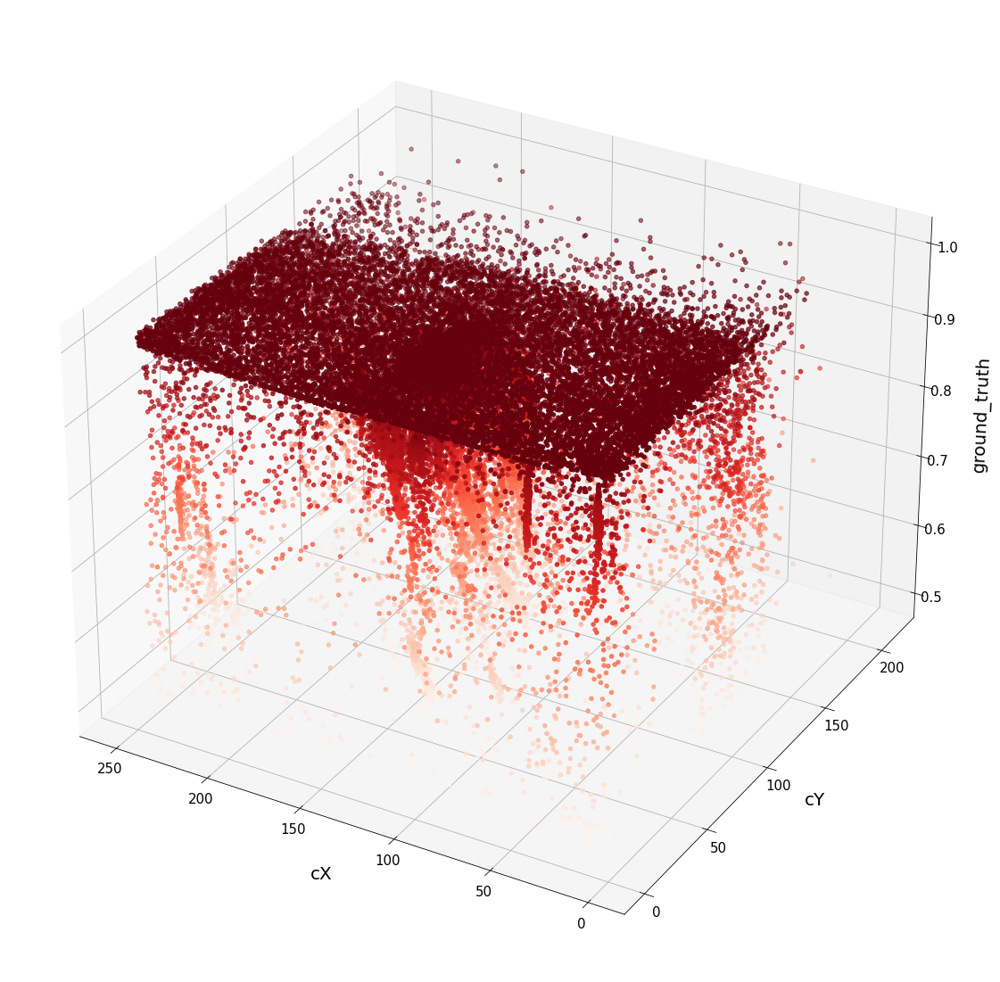

In [13]:
#for all rows in df_output, create a 2D plot of cX and cY with higher values of ground_truth being redder
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(projection='3d')
df_filtered = df_output[df_output['ground_truth'] > THRESHOLD]
ax.scatter(df_filtered['cX'], df_filtered['cY'], df_filtered['ground_truth'], c=df_filtered['ground_truth'], cmap='Reds')   
ax.set_xlabel('cX', fontsize=20, labelpad=20)
ax.set_ylabel('cY', fontsize=20, labelpad=20)
ax.set_zlabel('ground_truth', fontsize=20, labelpad=20)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.invert_xaxis()
#ax.invert_yaxis()
plt.show()

#### Setting the threshold values for the columns R, G, B, cX and cY with a lower and upper quantile, and threshold value

The following function takes quantile values that say that we cover 96% of all cases where the cY is in the upper half, and the threshold is greater than the defined threshold value. The reason we take quantiles, and not all the values is that we want to reduce false positive cases as much as possible. We then save the upper and lower limits of the values in a JSON file, which is used later for Baseline augmentation.

In [8]:
lower_q = 0.02
upper_q = 0.98

# Set the path to the threshold.json file
threshold_file = 'threshold.json'

update_thresholds(df_output, THRESHOLD, lower_q, upper_q, threshold_file)

56.83678130093905% of cases have ground_truth less than 0.5, cY greater than 128, and lie between the lower and upper quantiles.
The threshold.json file has been updated with the label, R, G, B, cX, and cY values.


True

#### Baseline Analysis of the Clusters

The mean values of precision and recall are: 
 precision    0.959041
recall       0.894661
dtype: float64
The median values of precision and recall are: 
 precision    0.983473
recall       0.982475
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.095867
recall       0.197212
dtype: float64


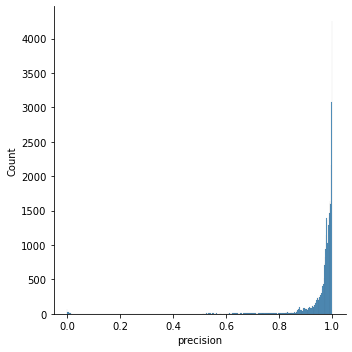

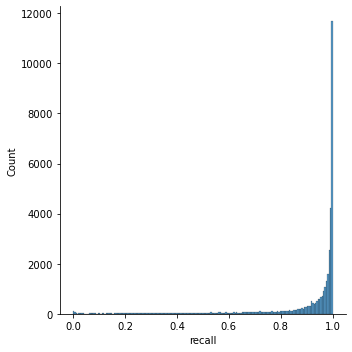

In [11]:
from baseline import baseline_mean_shift

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_METRIC_CSV_FILE, function = 'baseline')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline = pd.read_csv(BASELINE_METRIC_CSV_FILE)
df_baseline = df_baseline.dropna(subset=['precision'])

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline['precision'])
sns.displot(df_baseline['recall'])

#### Failure Cases for Baseline

6.603711285742587e-05
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\7233\20130827_040140.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 7233, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.0965125560760498


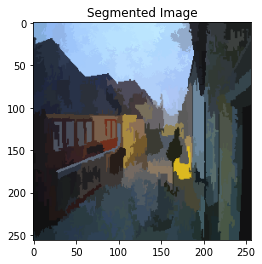

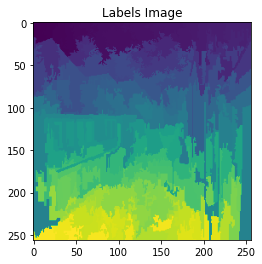

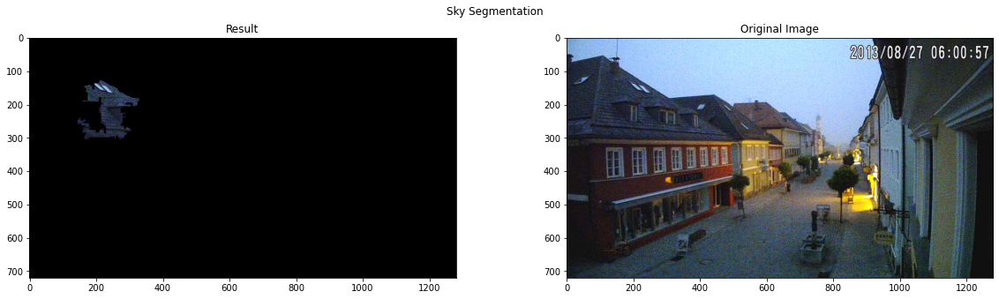

Precision: 6.603711285742587e-05
Recall: 6.527457751029707e-06
F1: 1.1880576445569138e-05
------------------------------------------------------------------------------------------------------------------------
0.0105744851895368
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140613_154529.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.06600141525268555


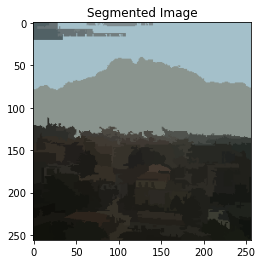

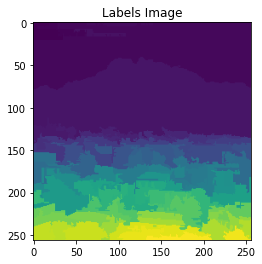

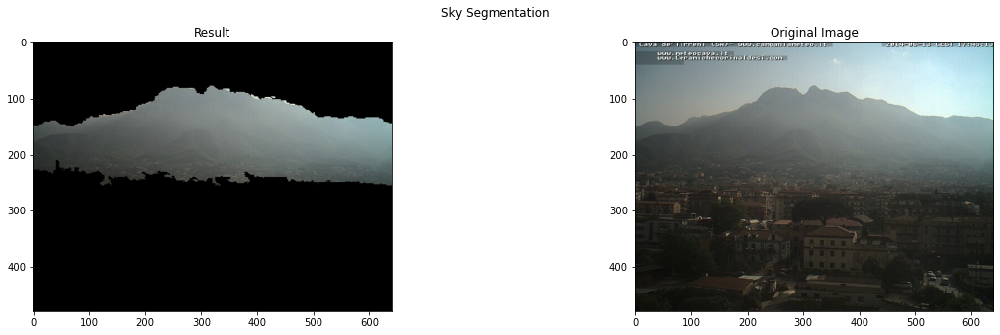

Precision: 0.010574485189536825
Recall: 0.013101641152944422
F1: 0.01170319065934818
------------------------------------------------------------------------------------------------------------------------
0.0096571114235071
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140618_114527.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.08251094818115234


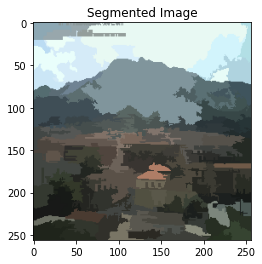

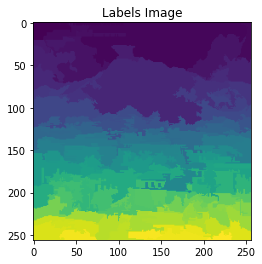

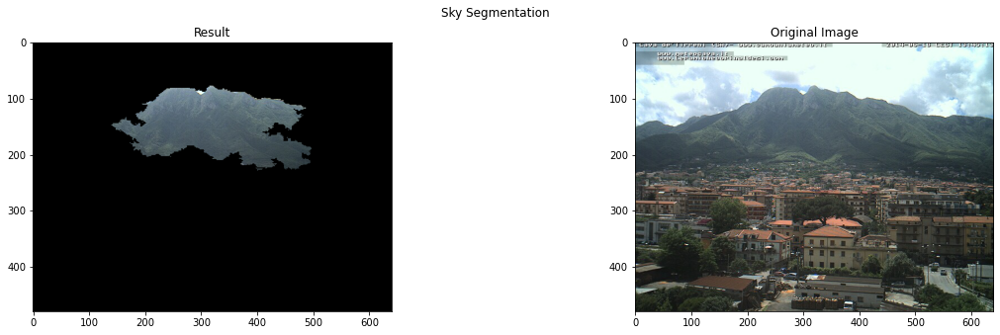

Precision: 0.009657111423507121
Recall: 0.004842243981673026
F1: 0.006450230146661087
------------------------------------------------------------------------------------------------------------------------
0.0063046486085554
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140524_131519.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.08051490783691406


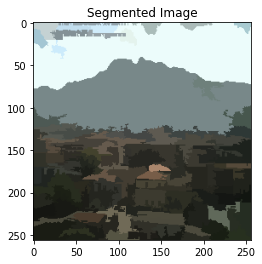

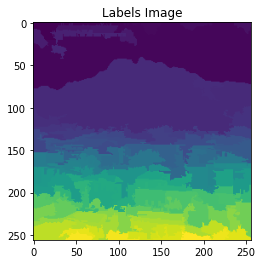

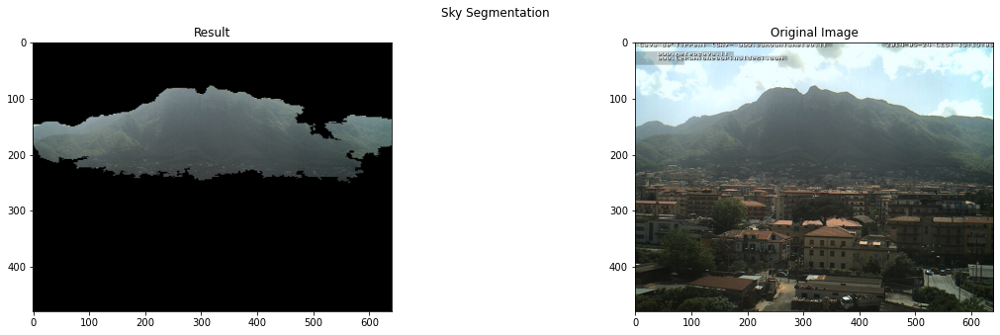

Precision: 0.006304648608555494
Recall: 0.006773012151580625
F1: 0.006530443390511649
------------------------------------------------------------------------------------------------------------------------
0.0116342896924745
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140831_121531.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.07251143455505371


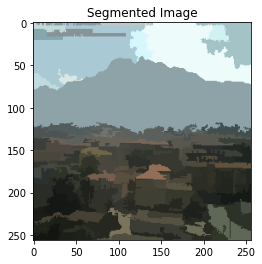

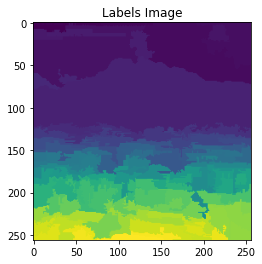

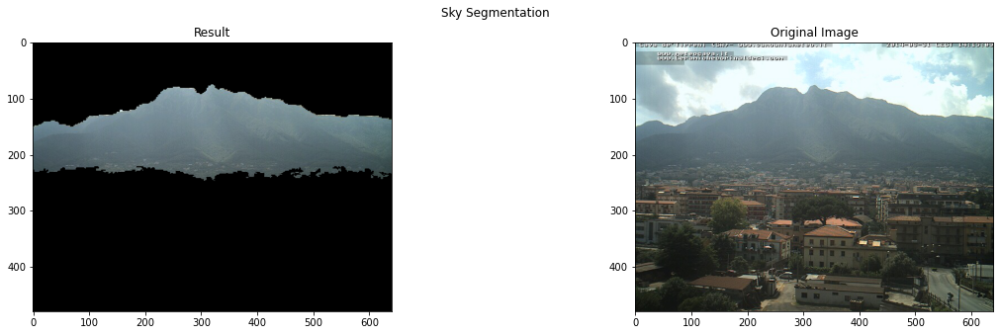

Precision: 0.01163428969247453
Recall: 0.013316170949600822
F1: 0.012418543500628787
------------------------------------------------------------------------------------------------------------------------


In [12]:
#show 5 images where precision is below 0.2
df_temp = df_baseline[df_baseline['precision'] < 0.2]

#perform plt.imread of the 'image_path' column'
for path, precision in df_temp.sample(n=5)[['image_path', 'precision']].values:
    img = plt.imread(str(path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(path, baseline_mean_shift, print_mode = 'display',dataset_mode='validate', spatial_radius=2, range_radius=2, min_density=150) 

#### Baseline Augmented Analysis of the Clusters

The mean values of precision and recall are: 
 precision    0.913366
recall       0.946245
dtype: float64
The median values of precision and recall are: 
 precision    0.969174
recall       0.994329
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.14349
recall       0.15021
dtype: float64


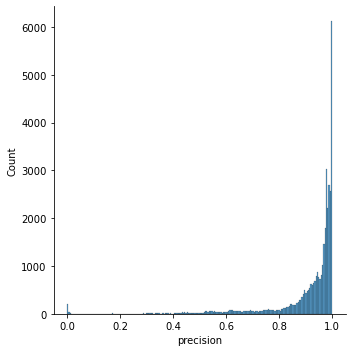

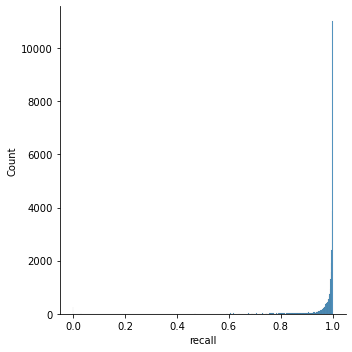

In [13]:
from baseline import baseline_augmented  #"R": [69.72868870665498, 250.6745962903452], "G": [93.74272721540538, 251.39504492798588], "B": [105.80529925621141, 252.79725294497683]

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_AUGMENTED_METRIC_CSV_FILE, function='baseline_augmented')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline_augmented = pd.read_csv(BASELINE_AUGMENTED_METRIC_CSV_FILE)

#replace all nan values with 0 in the precision column
df_baseline_augmented['precision'] = df_baseline_augmented['precision'].fillna(0)

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline_augmented[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline_augmented[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline_augmented[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline_augmented['precision'])
sns.displot(df_baseline_augmented['recall'])

#### Failure Cases for Basleine + Augmented

0.0
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\5021\20130722_081635.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 5021, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.10752153396606445


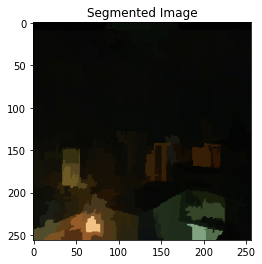

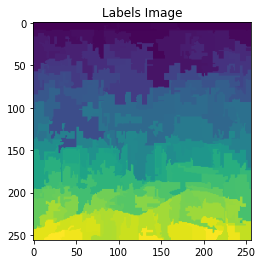

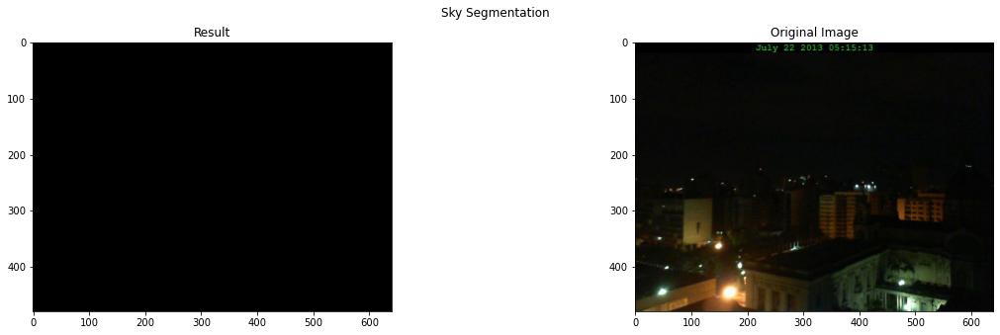

c:\Users\cjbla\OneDrive\Desktop\Code\masterthesis\baseline.py:288: RuntimeWarning: invalid value encountered in long_scalars
  precision = true_pos / (true_pos + false_pos)


Precision: nan
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
0.0015464486910416
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\19306\20130215_172333.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.11553835868835449


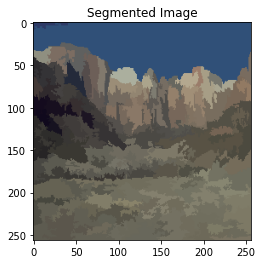

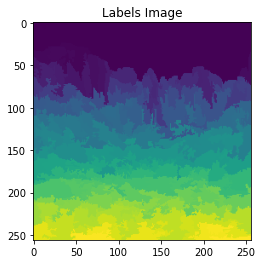

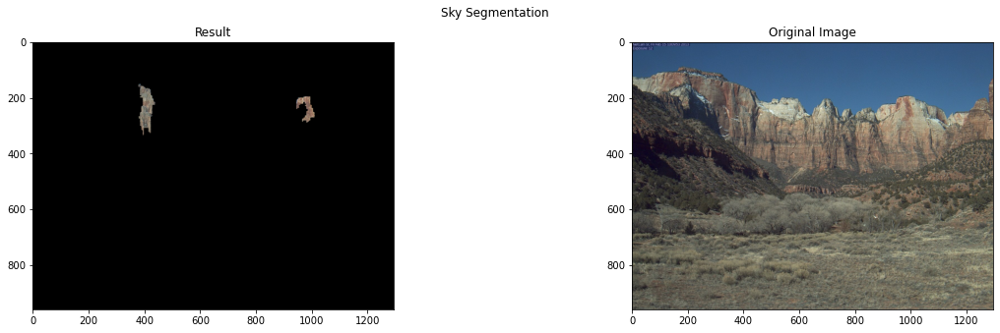

Precision: 0.0015464486910416436
Recall: 5.8684462031153065e-05
F1: 0.00011307785814382697
------------------------------------------------------------------------------------------------------------------------
0.172467760110179
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\4181\20131224_160049.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 4181, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.08652067184448242


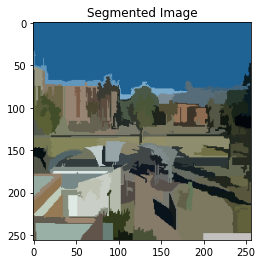

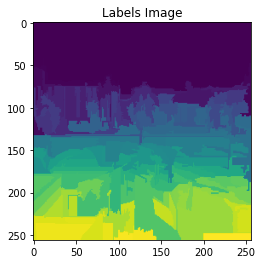

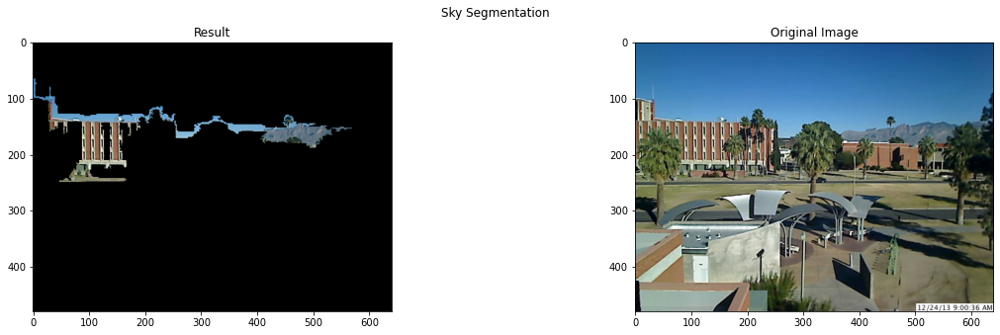

Precision: 0.17246776011017903
Recall: 0.03178210511743805
F1: 0.05367336203705508
------------------------------------------------------------------------------------------------------------------------
0.0
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\10066\20131226_155727.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 10066, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.12751412391662598


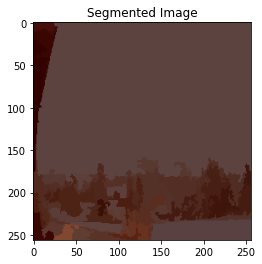

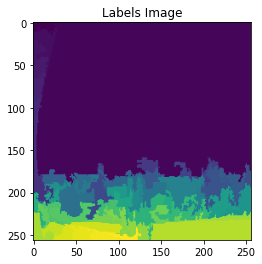

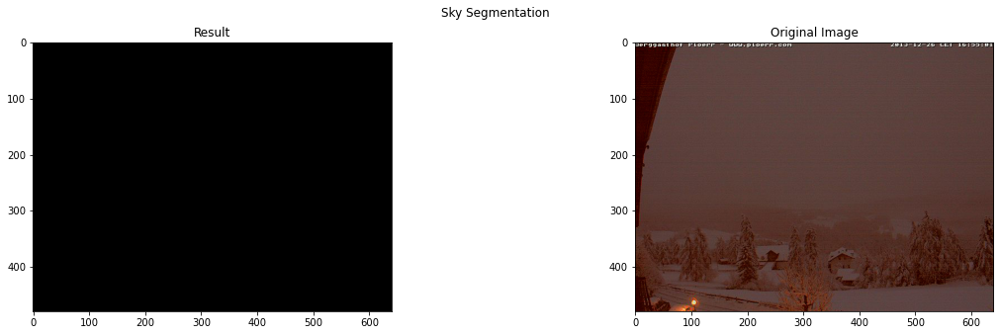

Precision: nan
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
0.005157725074833
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\19306\20130724_165324.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.1295332908630371


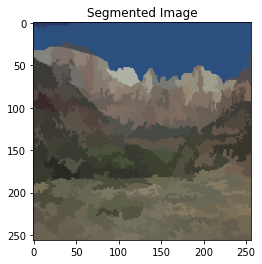

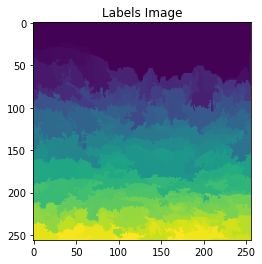

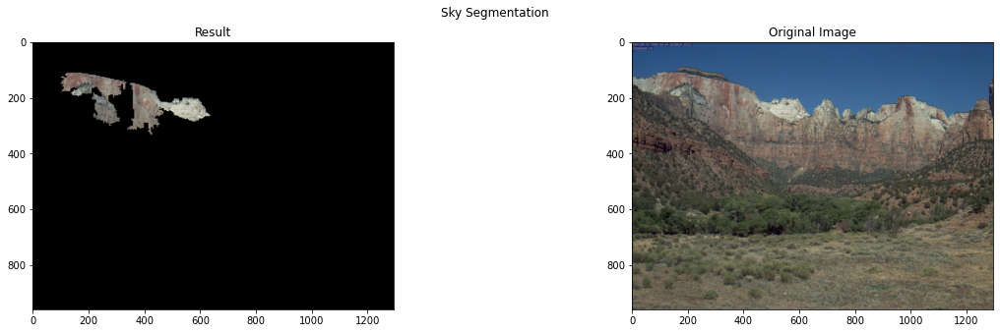

Precision: 0.005157725074833064
Recall: 0.000938951392498449
F1: 0.0015886862841053354
------------------------------------------------------------------------------------------------------------------------


In [14]:
#show 5 images where precision is below 0.2
df_temp = df_baseline_augmented[df_baseline_augmented['precision'] < 0.2]

#perform plt.imread of the 'image_path' column'
for path, precision in df_temp.sample(n=5)[['image_path', 'precision']].values:
    img = plt.imread(str(path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(path, baseline_augmented, print_mode='display', dataset_mode='validate', spatial_radius=2, range_radius=2, min_density=150)

#### Baseline + Top Third

The mean values of precision and recall are: 
 precision    0.963714
recall       0.896696
dtype: float64
The median values of precision and recall are: 
 precision    0.983714
recall       0.982556
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.070105
recall       0.193286
dtype: float64


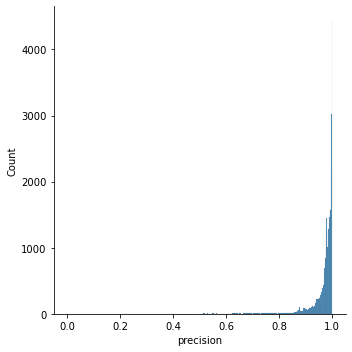

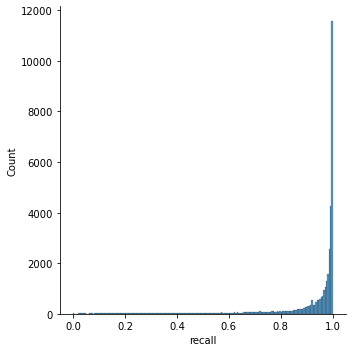

In [15]:
from baseline import baseline_mean_shift_third

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_TOPTHIRD_METRIC_CSV_FILE, function='baseline_topthird')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline_topthird = pd.read_csv(BASELINE_TOPTHIRD_METRIC_CSV_FILE)

#replace all nan values with 0 in the precision column
df_baseline_topthird['precision'] = df_baseline_topthird['precision'].fillna(0)

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline_topthird[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline_topthird[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline_topthird[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline_topthird['precision'])
sns.displot(df_baseline_topthird['recall'])

#### Example for high performance

0.9947924942210012
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\8438\20130711_131629.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 8438, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.058502912521362305


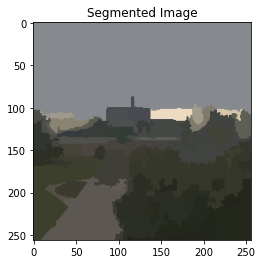

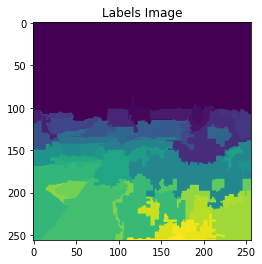

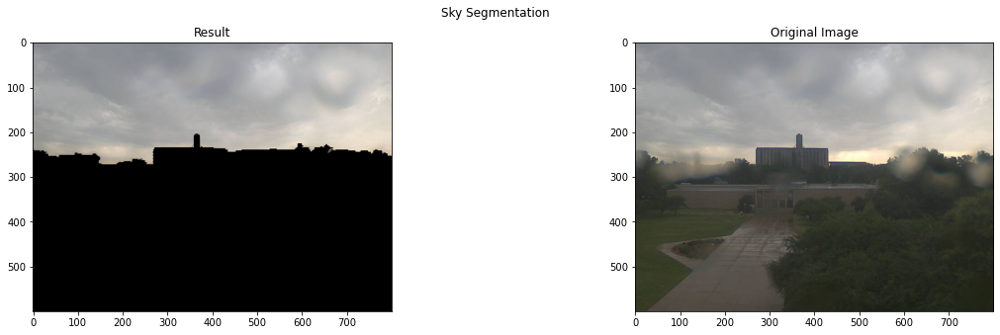

Precision: 0.9947924942210012
Recall: 0.9659866315616585
F1: 0.9801779690119791
------------------------------------------------------------------------------------------------------------------------


In [16]:
#show 5 images where precision is below 0.2
df_temp = df_baseline_topthird[df_baseline_topthird['precision'] > 0.99]

#perform plt.imread of the 'image_path' column'
for path, precision in df_temp.sample(n=1)[['image_path', 'precision']].values:
    print(precision)
    img = plt.imread(str(path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(path, baseline_mean_shift_third, print_mode='display', dataset_mode='validate', spatial_radius=2, range_radius=2, min_density=150)

#### Failure Cases for Baseline Top Third

38082
26
0.0064582099994618
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9708\20110722_200520.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9708, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.08654189109802246


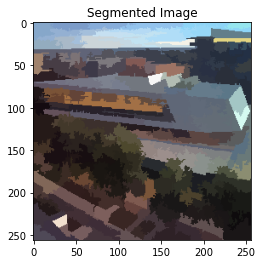

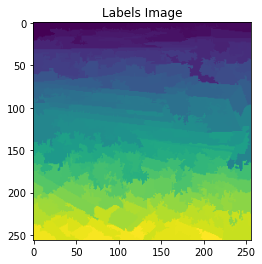

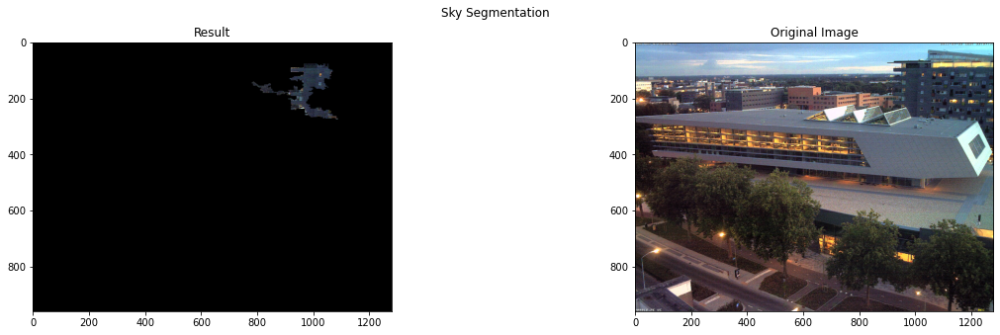

Precision: 0.006458209999461816
Recall: 0.0009231692400009232
F1: 0.001615421894351408
------------------------------------------------------------------------------------------------------------------------
0.0
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\5021\20130525_071643.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 5021, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.08125495910644531


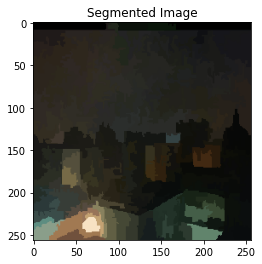

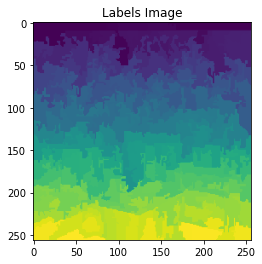

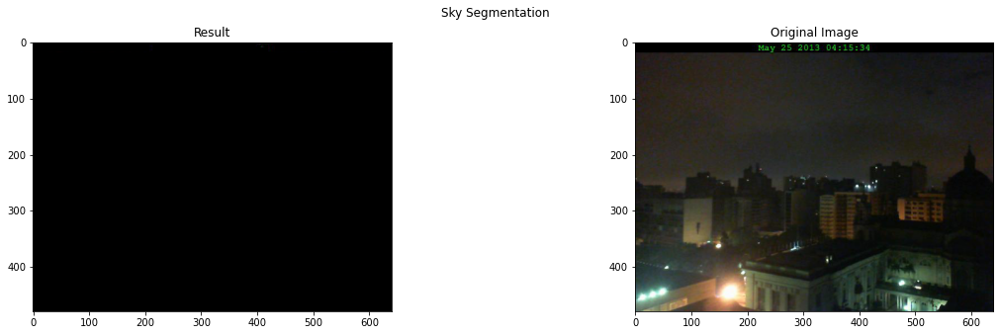

Precision: 0.0
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
0.0
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\4795\20121130_140418.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 4795, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.06951165199279785


c:\Users\cjbla\OneDrive\Desktop\Code\masterthesis\baseline.py:290: RuntimeWarning: invalid value encountered in double_scalars
  f1 = 2 * (precision * recall) / (precision + recall)


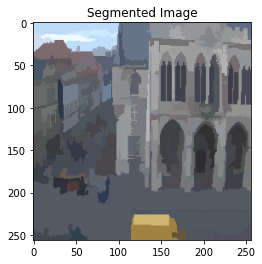

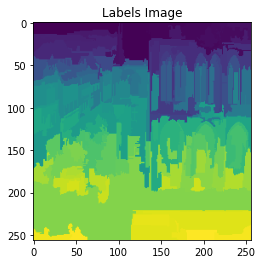

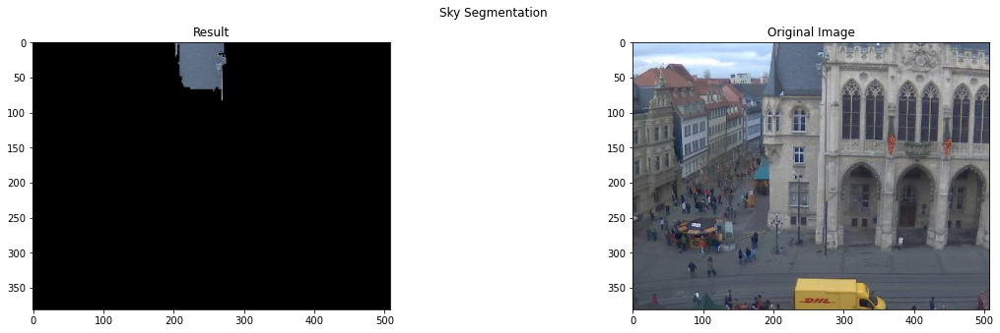

Precision: 0.0
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
0.0
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\4795\20121102_130415.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 4795, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.07252097129821777


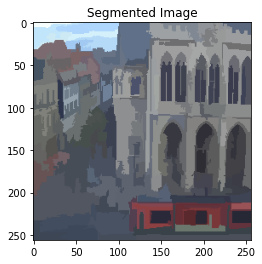

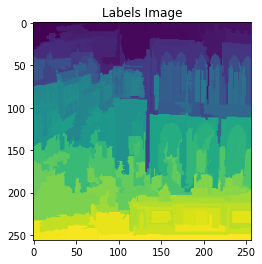

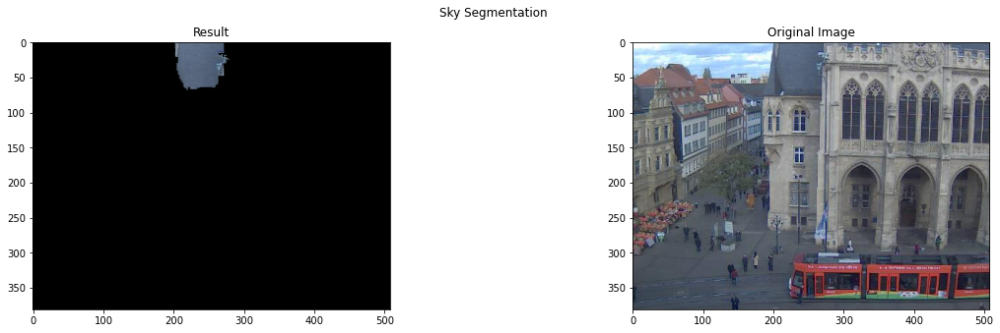

Precision: 0.0
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
0.0021488047273704
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\5021\20130712_061637.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 5021, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.06399965286254883


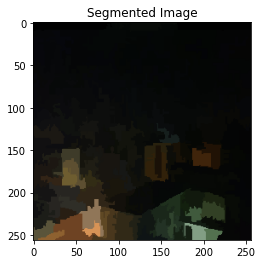

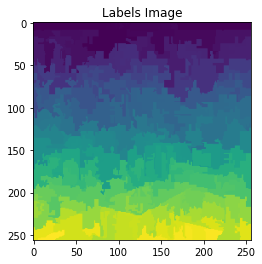

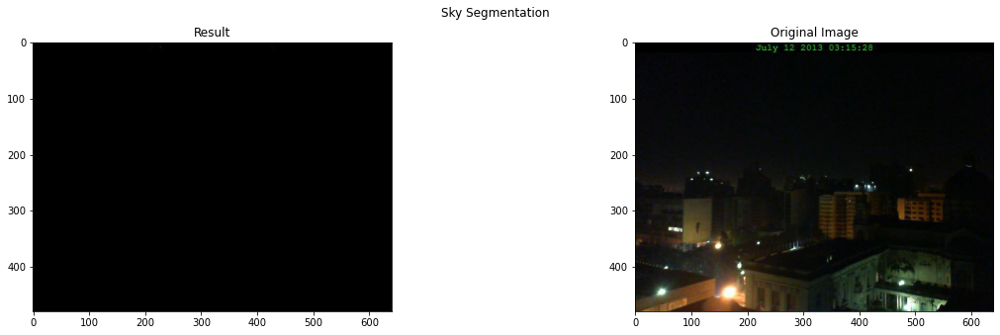

Precision: 0.0021488047273704003
Recall: 0.00011487898217221795
F1: 0.00021809804870402054
------------------------------------------------------------------------------------------------------------------------


In [19]:
#show 5 images where precision is below 0.2
df_temp = df_baseline_topthird[(df_baseline_topthird['recall'] < 0.2) & (df_baseline_topthird['precision'] < 0.2)]

print(len(df_baseline_topthird))
print(len(df_temp))

#perform plt.imread of the 'image_path' column'
for path, precision in df_temp.sample(n=5)[['image_path', 'precision']].values:
    print(precision)
    img = plt.imread(str(path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(path, baseline_mean_shift_third, print_mode='display', dataset_mode='validate', spatial_radius=2, range_radius=2, min_density=150)

#### Comparitive Table


The mean values of precision and recall are: 
                     precision    recall
method                                 
baseline             0.959041  0.894661
baseline_augmented   0.913366  0.946245
baseline_topthird    0.963714  0.896696

The median values of precision and recall are: 
                     precision    recall
method                                 
baseline             0.983473  0.982475
baseline_augmented   0.969174  0.994329
baseline_topthird    0.983714  0.982556

The standard deviation of precision and recall are: 
                     precision    recall
method                                 
baseline             0.095867  0.197212
baseline_augmented   0.143490  0.150210
baseline_topthird    0.070105  0.193286


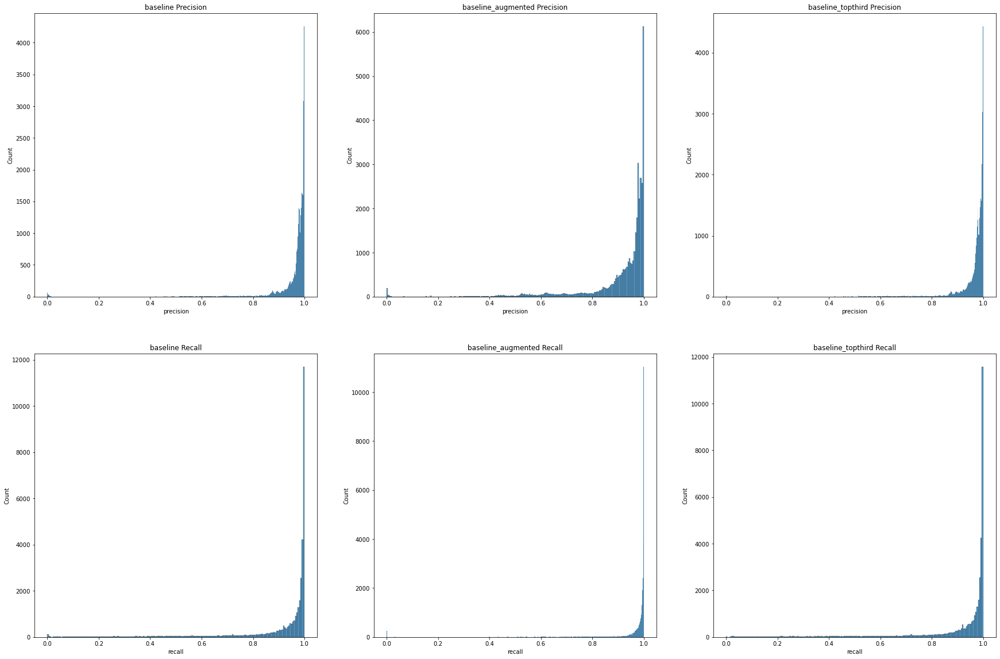

In [28]:
#take df_baseline, df_baseline_augmented, df_baseline_topthird and combine them into one dataframe, and show their mean, median and standard deviation based on the method
df_baseline['method'] = 'baseline'
df_baseline_augmented['method'] = 'baseline_augmented'
df_baseline_topthird['method'] = 'baseline_topthird'

df_combined = pd.concat([df_baseline, df_baseline_augmented, df_baseline_topthird])

print("\nThe mean values of precision and recall are: \n", df_combined.groupby('method')[['precision', 'recall']].mean())
print("\nThe median values of precision and recall are: \n", df_combined.groupby('method')[['precision', 'recall']].median())
print("\nThe standard deviation of precision and recall are: \n", df_combined.groupby('method')[['precision', 'recall']].std())

# Plot the distribution of precision and recall for each method
fig, axs = plt.subplots(2, 3, figsize=(30, 20))
for i, method in enumerate(df_combined['method'].unique()):
    sns.histplot(data=df_combined[df_combined['method'] == method], x='precision', ax=axs[0, i])
    axs[0, i].set_title(f'{method} Precision')
    sns.histplot(data=df_combined[df_combined['method'] == method], x='recall', ax=axs[1, i])
    axs[1, i].set_title(f'{method} Recall')

plt.show()

#### Baseline with Color Range 8

IntProgress(value=0, max=38082)

The mean values of precision and recall are: 
 precision    0.920666
recall       0.968776
dtype: float64
The median values of precision and recall are: 
 precision    0.971873
recall       0.997349
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.132949
recall       0.109068
dtype: float64


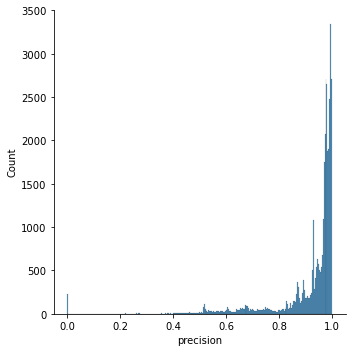

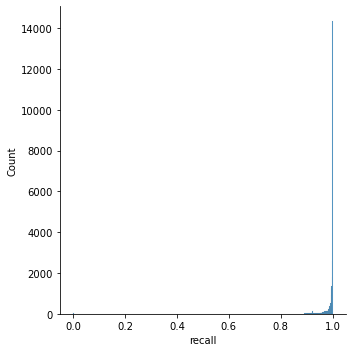

In [3]:
from baseline import baseline_mean_shift_third

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_TOPTHIRD_RR8_METRIC_CSV_FILE, function='baseline_topthird_rr8')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline_topthird_rr8 = pd.read_csv(BASELINE_TOPTHIRD_RR8_METRIC_CSV_FILE)

#replace all nan values with 0 in the precision column
df_baseline_topthird_rr8['precision'] = df_baseline_topthird_rr8['precision'].fillna(0)

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline_topthird_rr8[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline_topthird_rr8[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline_topthird_rr8[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline_topthird_rr8['precision'])
sns.displot(df_baseline_topthird_rr8['recall'])

#### Baseline with middle sixth augmented

IntProgress(value=0, max=38082)

The mean values of precision and recall are: 
 precision    0.907575
recall       0.923538
dtype: float64
The median values of precision and recall are: 
 precision    0.964985
recall       0.988174
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.130854
recall       0.152287
dtype: float64


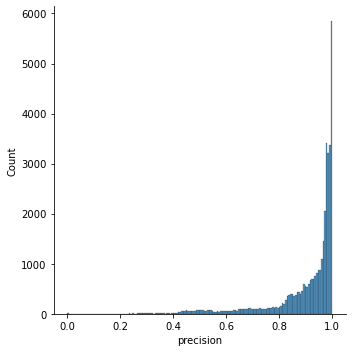

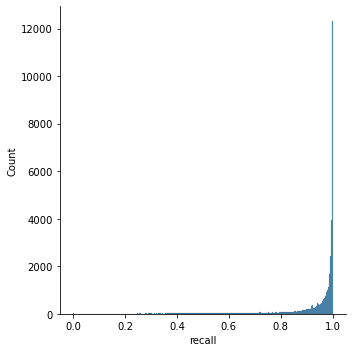

In [4]:
from baseline import baseline_mean_shift_third_augmented

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_TOPTHIRD_AUGMENTED_METRIC_CSV_FILE, function='baseline_topthird_augmented')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline_topthird_augmented = pd.read_csv(BASELINE_TOPTHIRD_AUGMENTED_METRIC_CSV_FILE)

#replace all nan values with 0 in the precision column
df_baseline_topthird_augmented['precision'] = df_baseline_topthird_augmented['precision'].fillna(0)

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline_topthird_augmented[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline_topthird_augmented[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline_topthird_augmented[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline_topthird_augmented['precision'])
sns.displot(df_baseline_topthird_augmented['recall'])

### Visual Inspection of Images

False Positive Cases: Cases where the cluster is predicted sky but is not sky

C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140508_104523.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.08208632469177246


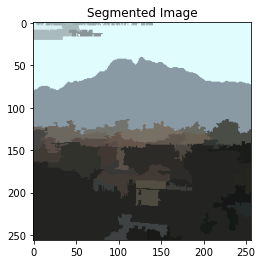

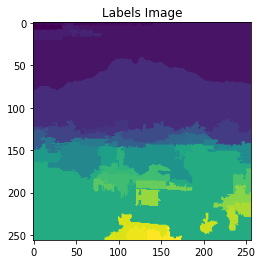

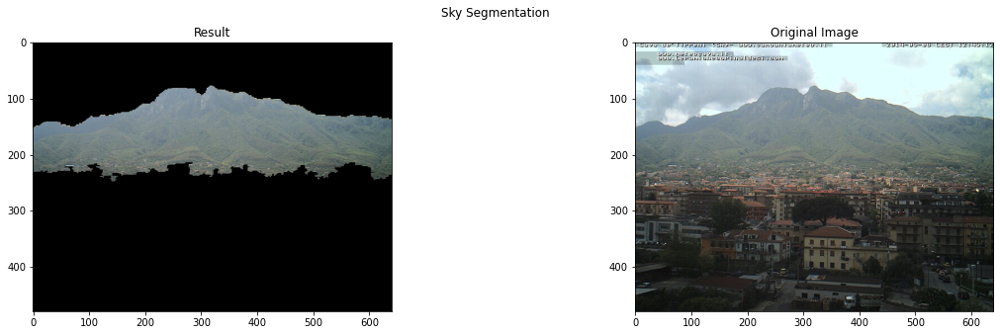

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\19306\20130516_232329.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06699967384338379


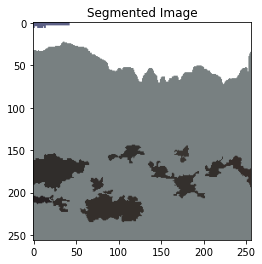

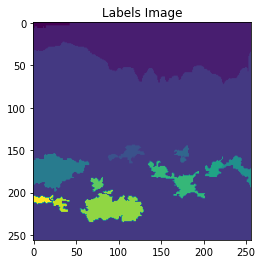

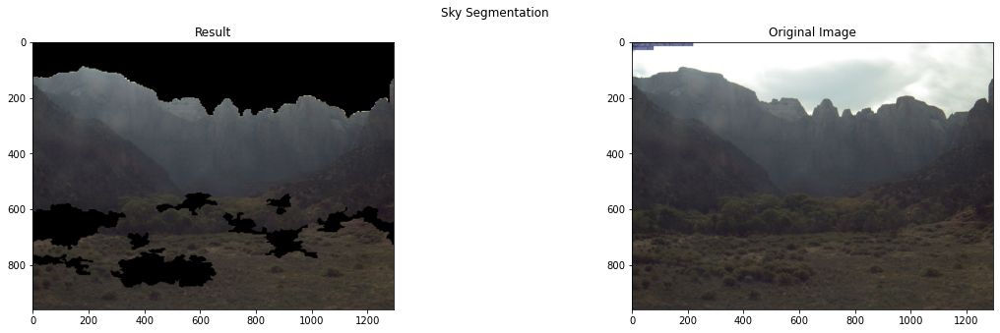

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140409_111522.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.060524702072143555


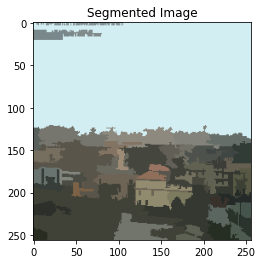

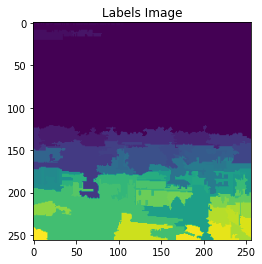

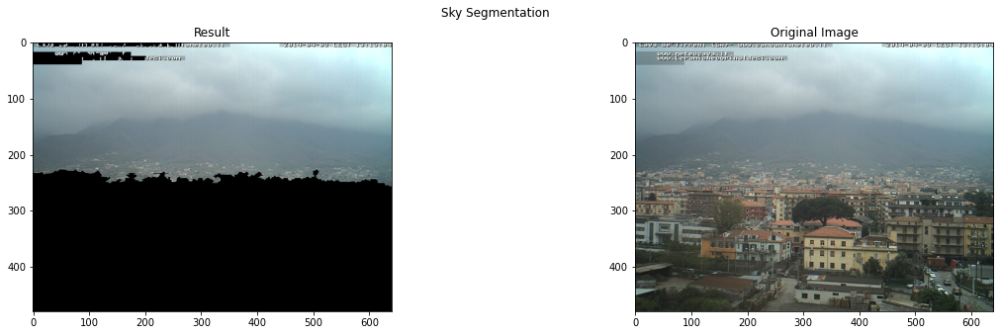

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140806_114523.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06452536582946777


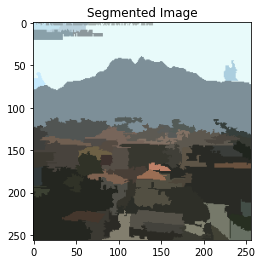

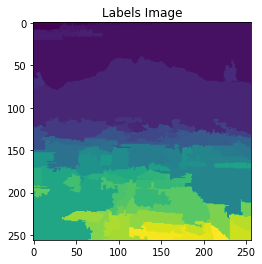

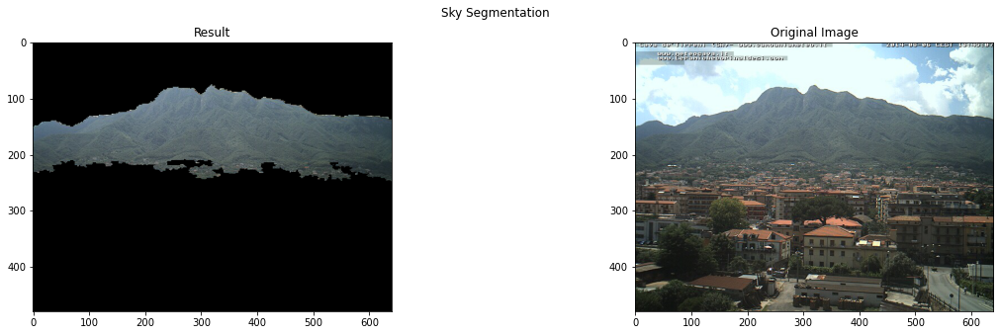

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140720_161521.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07000231742858887


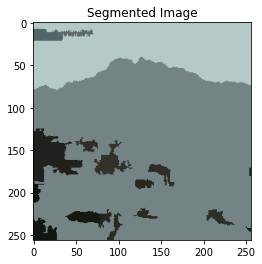

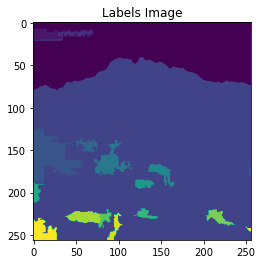

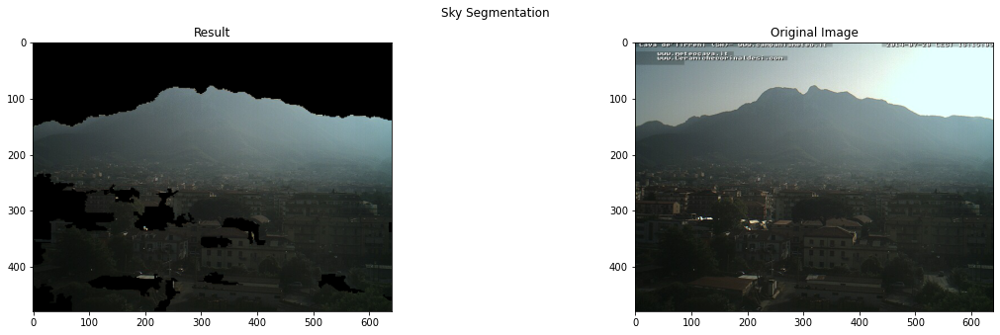

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\19306\20130608_122328.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07952260971069336


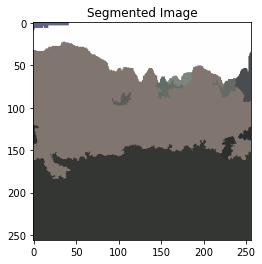

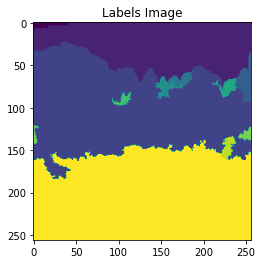

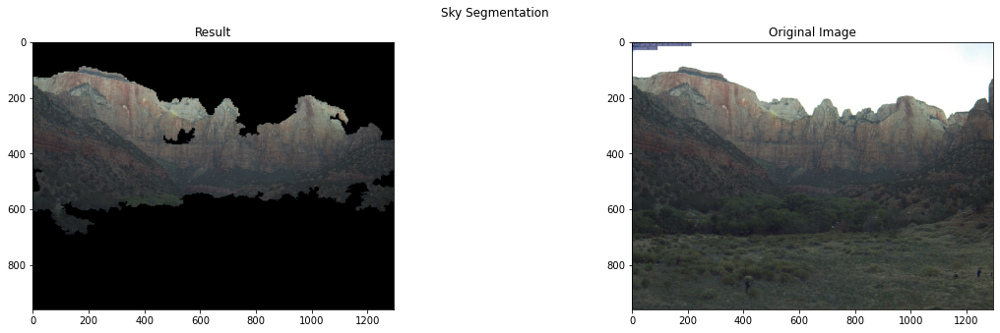

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\19306\20130210_145324.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.13303351402282715


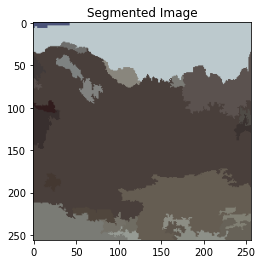

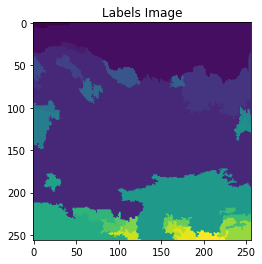

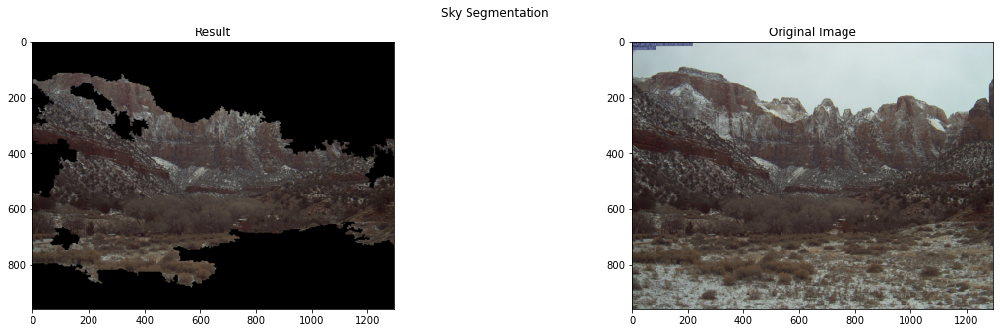

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\4795\20130307_063420.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 4795, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06352043151855469


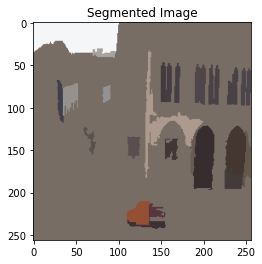

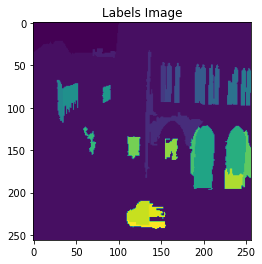

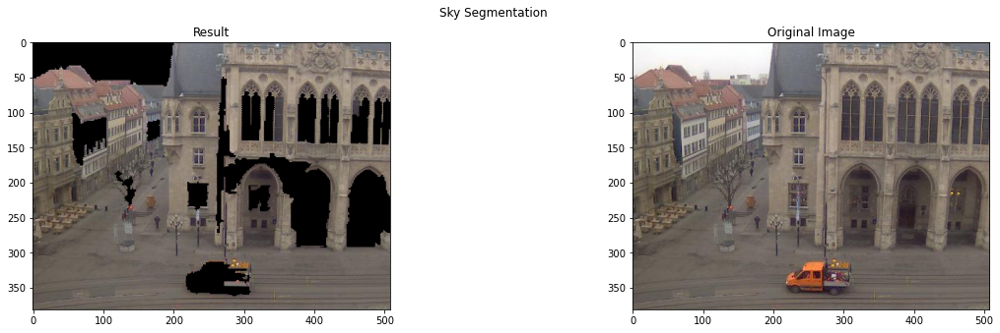

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140516_164529.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.05900740623474121


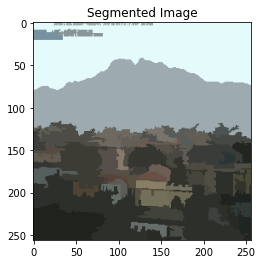

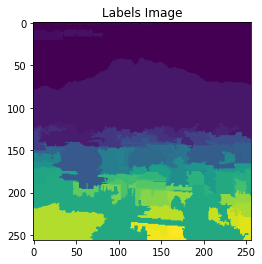

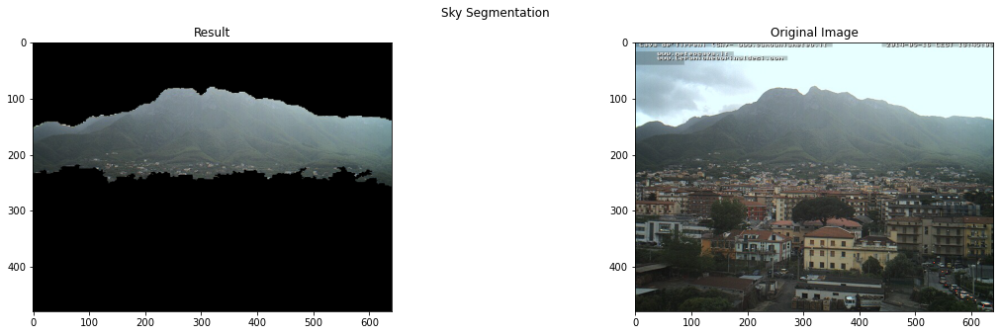

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\9291\20140328_121520.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06952595710754395


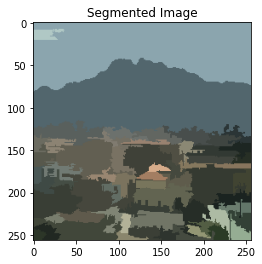

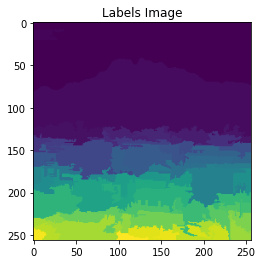

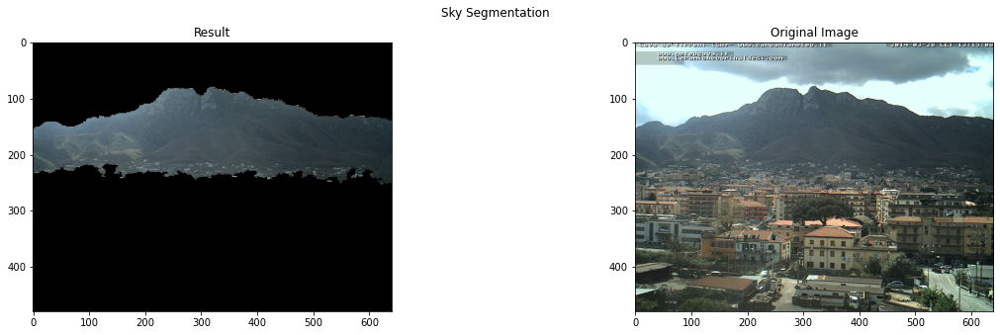

------------------------------------------------------------------------------------------------------------------------


In [10]:
#show number of rows where predicted_value = 1 and ground_truth < 0.2
df_temp = df_output[(df_output['predicted_value'] == 1) & (df_output['ground_truth'] < THRESHOLD)]

#randomly sample 10 image_path values from df_temp and show the images
for path in resample(df_temp['image_path'], n_samples=10):
    img = plt.imread(str(path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(path, baseline_mean_shift, print_mode = 'display',dataset_mode='original', spatial_radius=2, range_radius=8, min_density=150)

False Negative Cases: Cases where cluster is predicted ground, but is not ground

C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\7371\20120826_091725.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 7371, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.08328080177307129


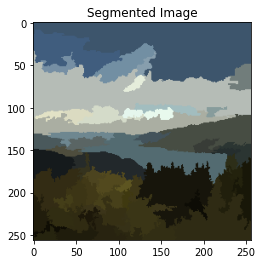

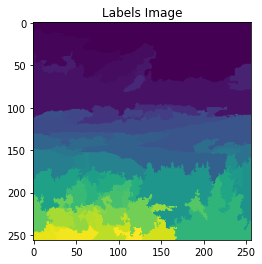

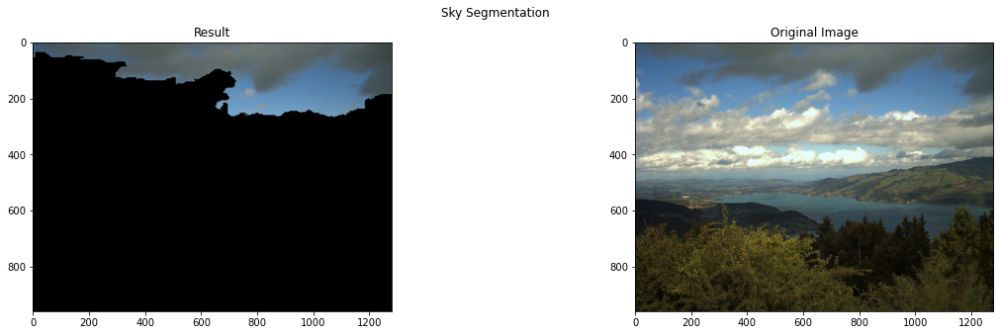

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\7371\20120915_121720.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 7371, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07299971580505371


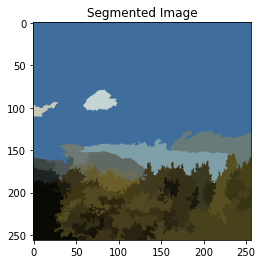

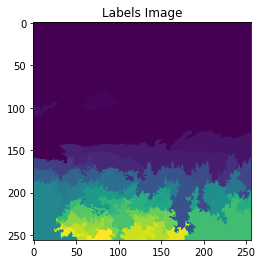

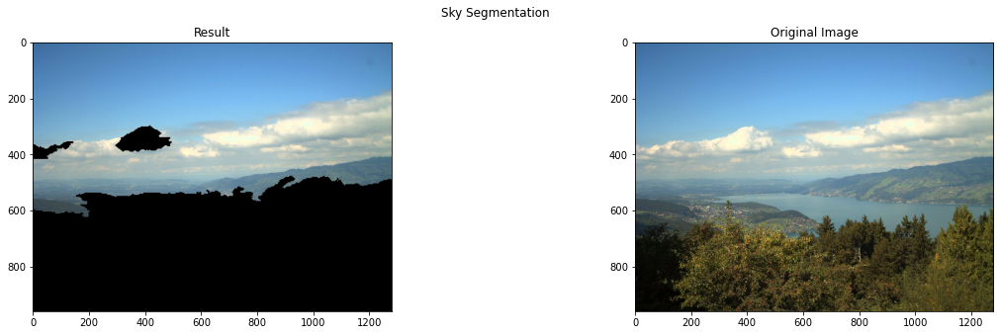

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\684\20121215_194146.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 684, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.04900050163269043


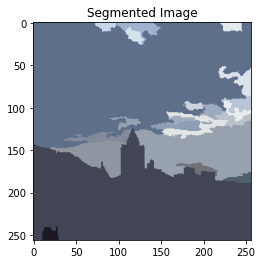

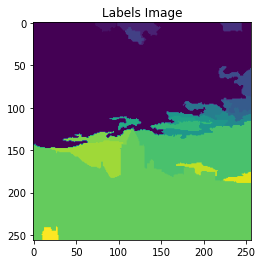

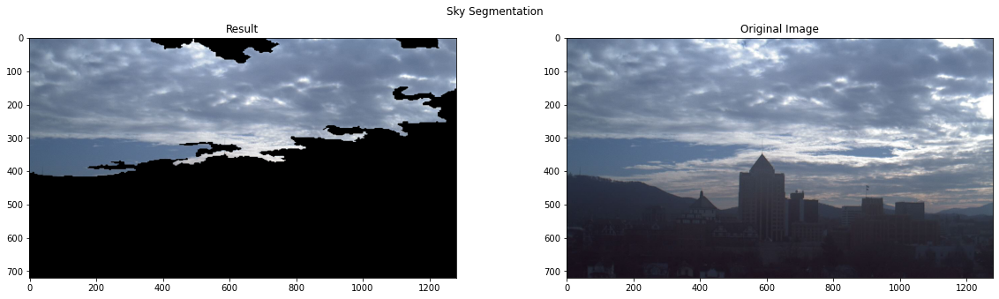

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\19388\20130609_201412.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19388, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07751107215881348


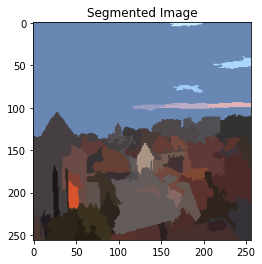

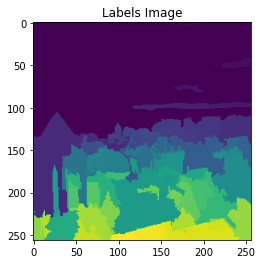

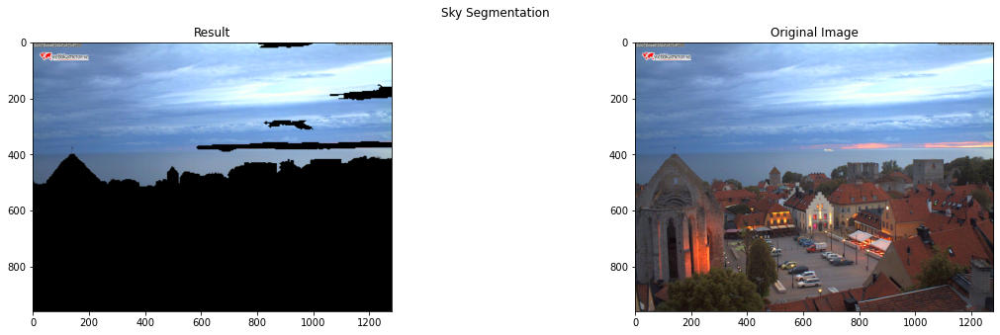

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\19388\20130616_111429.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19388, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07751321792602539


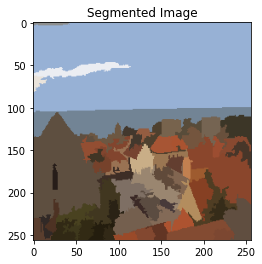

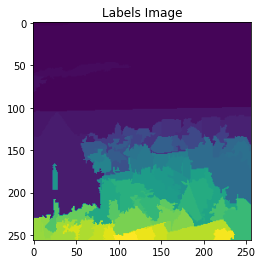

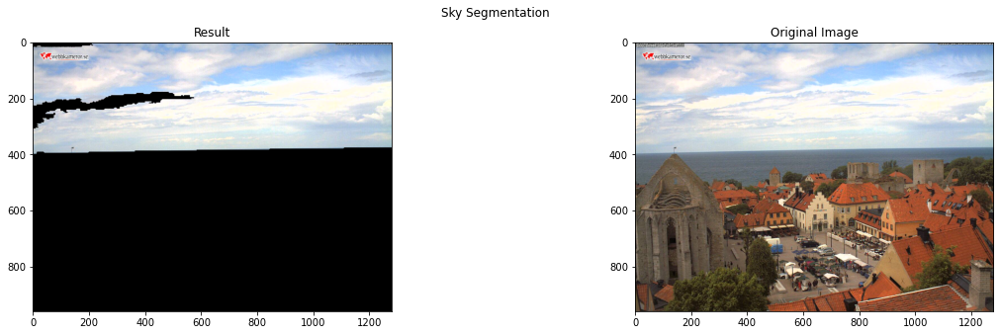

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\623\20140910_211155.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 623, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06051492691040039


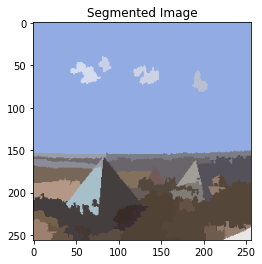

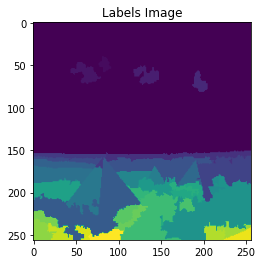

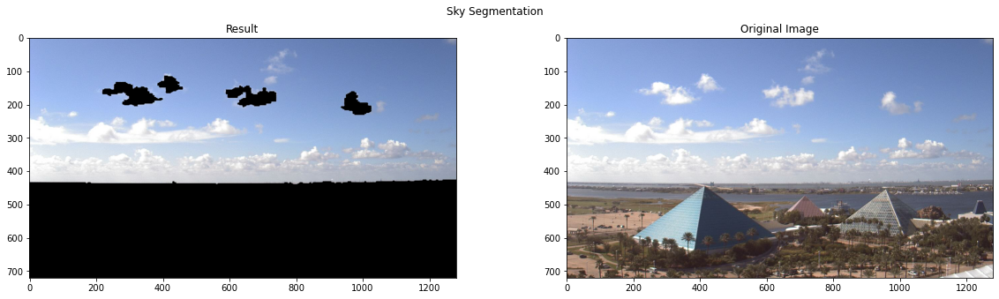

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\7371\20120618_071759.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 7371, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07451319694519043


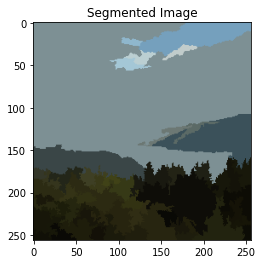

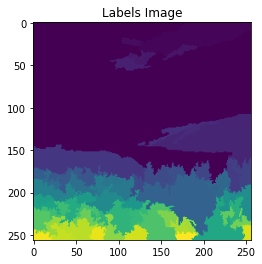

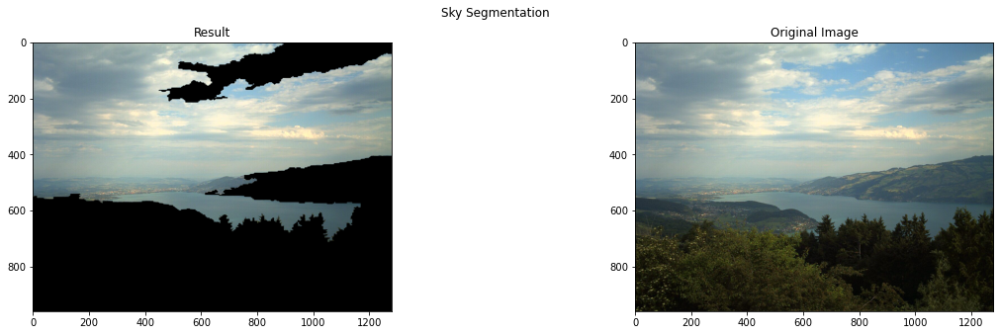

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\4181\20130301_150158.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 4181, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06351923942565918


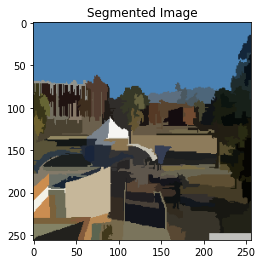

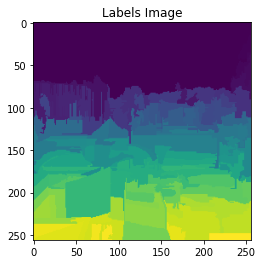

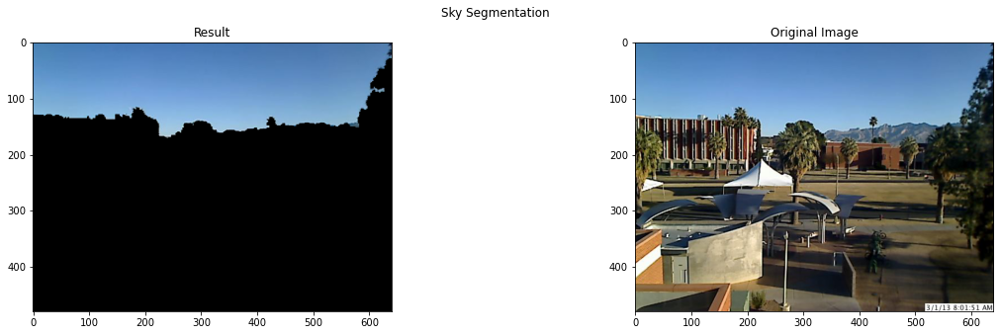

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\11160\20131109_142320.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 11160, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07551383972167969


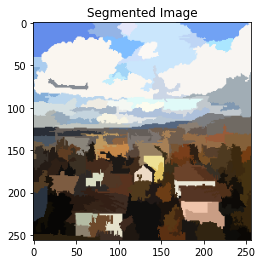

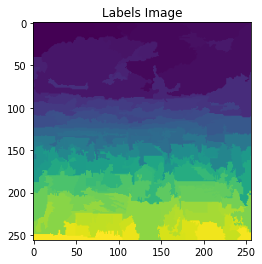

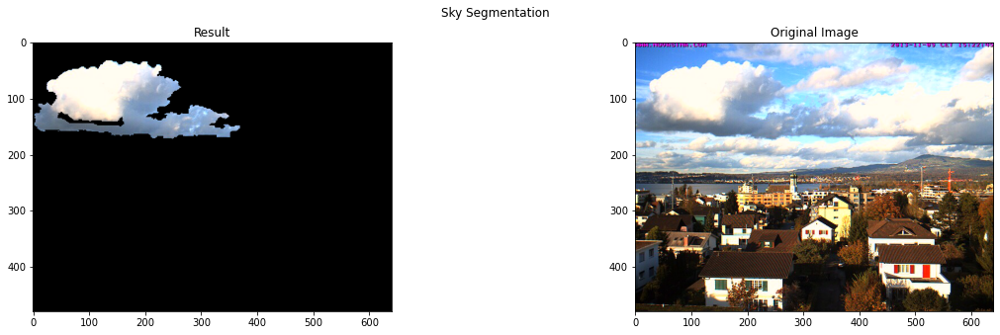

------------------------------------------------------------------------------------------------------------------------
C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\8733\20130627_160653.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 8733, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.05400514602661133


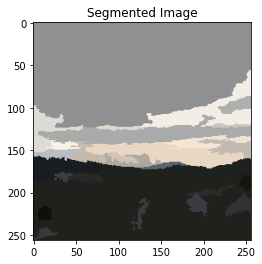

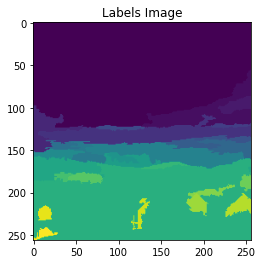

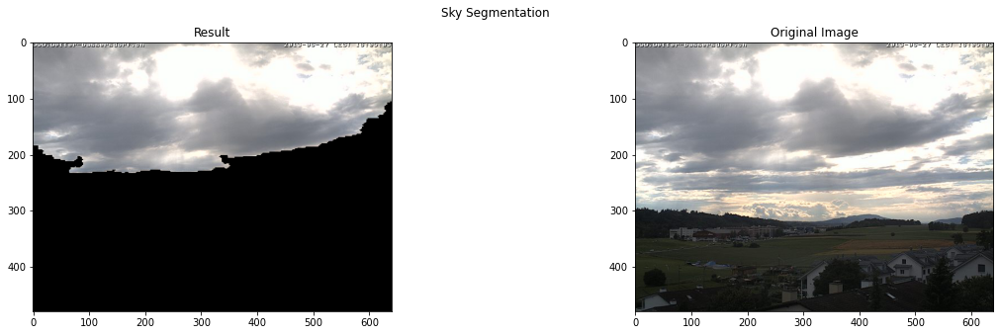

------------------------------------------------------------------------------------------------------------------------


In [13]:
#show number of rows where predicted_value = 0 and ground_truth > 0.2
df_temp = df_output[(df_output['predicted_value'] == 0) & (df_output['ground_truth'] > THRESHOLD)]

#randomly sample 10 image_path values from df_temp and show the images
for path in resample(df_temp['image_path'], n_samples=10):
    img = plt.imread(str(path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(path, baseline_mean_shift, print_mode = 'display',dataset_mode='original', spatial_radius=2, range_radius=8, min_density=150)

### Undersampling and Resampling

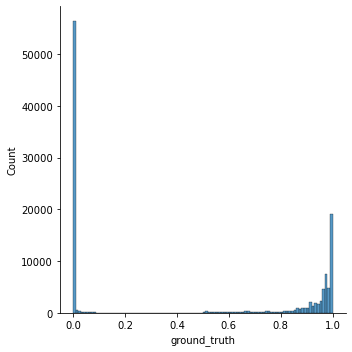

In [6]:
df_resampled = resample_df(df_output,THRESHOLD)
sns.displot(df_resampled['ground_truth'], bins=100)

### Model on Cluster Metadata 

##### Regression + Metadata model

In [7]:
train_features, train_labels, test_features, test_labels, scaler = split_data(df_resampled, THRESHOLD, regression=True)

In [31]:
mlflow.start_run()
mlflow.keras.autolog()

#Create the model
feature_regression_model = feature_regression_model(input_shape=(train_features.shape[1],))

# Train the model
feature_regression_model.fit(train_features, train_labels, epochs=20)

# Evaluate the model on the test set
test_loss = feature_regression_model.evaluate(test_features, test_labels)
print(f'Test loss: {test_loss:.2f}')

#save the model
feature_regression_model.save('models/feature_regression_model.h5')

mlflow.end_run()

Epoch 1/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0348
Epoch 2/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0302
Epoch 3/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0287
Epoch 4/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0280
Epoch 5/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0275
Epoch 6/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0272
Epoch 7/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0268
Epoch 8/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0266
Epoch 9/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0265
Epoch 10/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0263
Epoch 11/20
2935/2935 [==============================] - 10s 3ms/step - loss: 0.0260
Epoch 12/20
2935/2935 [==============================] - 10s 3ms/step - lo

##### Classification + Metadata model

In [4]:
train_features, train_labels, test_features, test_labels, scaler = split_data(df_resampled, THRESHOLD, regression=False)

In [33]:
mlflow.start_run()
mlflow.keras.autolog()

#Create the model
feature_classification_model = feature_classification_model(input_shape=(train_features.shape[1],))

# Train the model
feature_classification_model.fit(train_features, train_labels, epochs=20)

# Evaluate the model on the test set
test_loss = feature_classification_model.evaluate(test_features, test_labels)
print(f'Test loss: {test_loss[0]:.2f}')

#save the model
feature_classification_model.save('models/feature_classification_model.h5')


mlflow.end_run()

Epoch 1/20
2935/2935 [==============================] - 14s 5ms/step - loss: 0.1297 - accuracy: 0.9508
Epoch 2/20
2935/2935 [==============================] - 13s 4ms/step - loss: 0.1156 - accuracy: 0.9561
Epoch 3/20
2935/2935 [==============================] - 13s 4ms/step - loss: 0.1109 - accuracy: 0.9577
Epoch 4/20
2935/2935 [==============================] - 13s 4ms/step - loss: 0.1082 - accuracy: 0.9585
Epoch 5/20
2935/2935 [==============================] - 13s 4ms/step - loss: 0.1061 - accuracy: 0.9588
Epoch 6/20
2935/2935 [==============================] - 12s 4ms/step - loss: 0.1045 - accuracy: 0.9597
Epoch 7/20
2935/2935 [==============================] - 12s 4ms/step - loss: 0.1031 - accuracy: 0.9601
Epoch 8/20
2935/2935 [==============================] - 12s 4ms/step - loss: 0.1028 - accuracy: 0.9600
Epoch 9/20
2935/2935 [==============================] - 12s 4ms/step - loss: 0.1009 - accuracy: 0.9613
Epoch 10/20
2935/2935 [==============================] - 12s 4ms/step - l

### Testing with real world data

Failure Cases images: 4795, 7233, 9291, 9708, 10870, 11131, 19306

In [29]:
# Create and display a FileChooser widget
fc = FileChooser('C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset')
display(fc)

FileChooser(path='C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset', filename='', title='', show_hidden=False…

#### Display image with cluster information

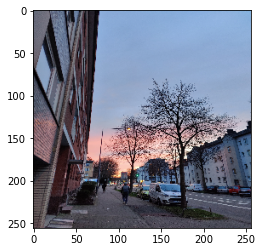

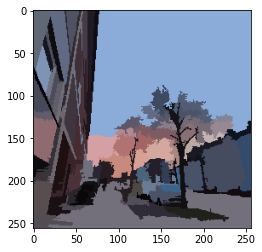

In [46]:
image = plt.imread(fc.selected)
image = cv2.resize(image, (256, 256))
plt.imshow(image)
plt.show()

(segmented_image, labels_image, number_regions) = pms.segment(image, spatial_radius=2, range_radius=8, min_density=150)
plt.imshow(segmented_image)
plt.show()

#### Using Baseline with Top Third

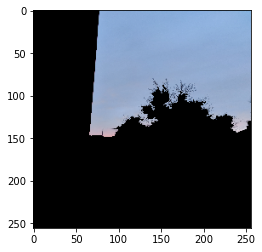

In [47]:
mask, segmented_image, labels_image = baseline_mean_shift_third(image, range_radius=8)

#mask the image
masked_image = cv2.bitwise_and(image, image, mask=mask)
plt.imshow(masked_image)
plt.show()

#### Using Regression Model

1/1 [==============================] - 0s 163ms/step


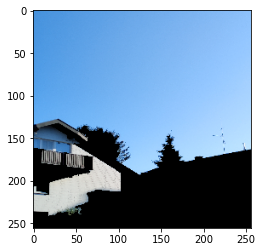

In [15]:
feature_regression_model = keras.models.load_model('models/feature_regression_model.h5')

prediction = predict_ground_truth(fc.selected, feature_regression_model, scaler, THRESHOLD, verbose=1)

#### Using Classification Model

1/1 [==============================] - 0s 57ms/step


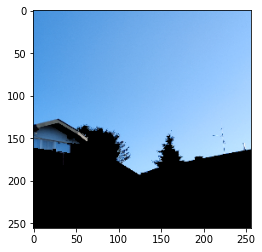

In [16]:
feature_classification_model = keras.models.load_model('models/feature_classification_model.h5')

prediction = predict_ground_truth(fc.selected, feature_classification_model, scaler, 0.9, verbose=1)

### Analysis on Dataset

In [8]:
make_cluster_separated_metadata(ORIGINAL_IMAGES_CSV, COLUMNS , CLUSTER_REGRESSION_CSV_FILE, regression=True)

IntProgress(value=0, max=38082)

2/2 [==============================] - 0s 5ms/step


True positive: 58047 (number of clusters, added)
False positive: 208432 (number of clusters, added)
True negative: 623795 (number of clusters, added)
False negative: 643 (number of clusters, added)
Precision: 0.21782954754408415
Recall: 0.9890441301754984
F1: 0.3570266538323149
True positive: 1220919009 (pixels)
False positive: 203968814 (pixels)
True negative: 1055016316 (pixels)
False negative: 15748273 (pixels)
Precision: 0.8568527215212225
Recall: 0.987265553775684
F1: 0.9174478534796295


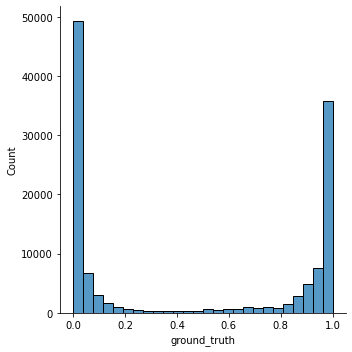

In [2]:
df_output = preprocess_data(CLUSTER_REGRESSION_CSV_FILE, COLUMNS, plot=True)
df_cluster_cases = calculate_metrics(df_output, THRESHOLD, print_metrics=True, pixel_level_calculation=False)
print("-----------------------------------------------------------------------------------")
df_pixel_cases = calculate_metrics(df_output, THRESHOLD, print_metrics=True, pixel_level_calculation=True)

In [ ]:
make_cluster_separated_metadata(ORIGINAL_IMAGES_CSV, COLUMNS , CLUSTER_CLASSIFICATION_CSV_FILE, regression=False)

True positive: 57783 (number of clusters, added)
False positive: 167147 (number of clusters, added)
True negative: 665080 (number of clusters, added)
False negative: 907 (number of clusters, added)
Precision: 0.25689325567954474
Recall: 0.9845459192366672
F1: 0.40746773852337637
True positive: 1223378278 (pixels)
False positive: 185221782 (pixels)
True negative: 1073763348 (pixels)
False negative: 13289004 (pixels)
Precision: 0.8685064786948824
Recall: 0.9892541800099147
F1: 0.9249562481462035


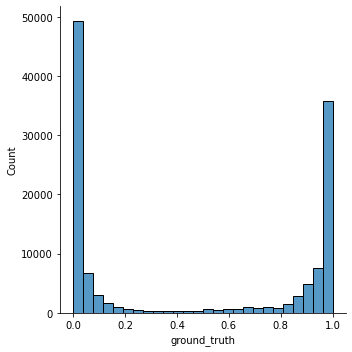

In [3]:
df_output = preprocess_data(CLUSTER_CLASSIFICATION_CSV_FILE, COLUMNS, plot=True)
df_cluster_cases = calculate_metrics(df_output, THRESHOLD, print_metrics=True, pixel_level_calculation=False)
print("-----------------------------------------------------------------------------------")
df_pixel_cases = calculate_metrics(df_output, THRESHOLD, print_metrics=True, pixel_level_calculation=True)